### Code for creating surface elevation graphs (3D) & sketchs

In [1]:
import os
import sys
import gc
import ast
import warnings
import pylab
import math as m
import numpy as np
import pandas as pd
import scipy
from scipy import stats, interpolate
from scipy.signal import butter, filtfilt, hilbert, find_peaks

from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib.colors import LightSource
from matplotlib.patches import FancyArrowPatch
from mpl_toolkits.axes_grid1 import make_axes_locatable
from mpl_toolkits.mplot3d import Axes3D, proj3d
import matplotlib.tri as mtri
import cmocean.cm as cm

sys.path.extend([
    '/projects/DEIKE/cmartinb/jupyter_notebook/project_specific/turbulence',
    '/projects/DEIKE/cmartinb/functions',
])
os.chdir('/projects/DEIKE/cmartinb/')

from prepare import load_object, save_object, field
from defs import Case, Interface2D
from phase import extract_phase
from funciones import *

warnings.filterwarnings("ignore", category=RuntimeWarning)

In [2]:
params = {'legend.fontsize': 'x-Large',
          'figure.figsize': (15, 6),
         'axes.labelsize': 30,
         'axes.titlesize':30,
         'xtick.labelsize':30,
         'ytick.labelsize':30,
    'font.family': 'STIXGeneral', 
    'axes.titleweight': 'normal',
    'axes.labelweight': 'normal',
    'text.usetex': True, # Enable LaTeX rendering
}

plt.rcParams.update(params)
pylab.rcParams.update(params)


In [3]:
class Arrow3D(FancyArrowPatch):
    def __init__(self, xs, ys, zs,
                 arrowstyle='-|>',
                 mutation_scale=10,
                 lw=1,
                 **kwargs):
        super().__init__((0,0), (0,0),
                         arrowstyle=arrowstyle,
                         mutation_scale=mutation_scale,
                         lw=lw,
                         **kwargs)
        self._verts3d = xs, ys, zs

    def draw(self, renderer):
        xs3d, ys3d, zs3d = self._verts3d
        proj = self.axes.get_proj()
        xs, ys, _ = proj3d.proj_transform(xs3d, ys3d, zs3d, proj)
        self.set_positions((xs[0], ys[0]), (xs[1], ys[1]))
        super().draw(renderer)

    def do_3d_projection(self, renderer=None):
        xs3d, ys3d, zs3d = self._verts3d
        proj = self.axes.get_proj()
        xs, ys, zs2 = proj3d.proj_transform(xs3d, ys3d, zs3d, proj)
        self.set_positions((xs[0], ys[0]), (xs[1], ys[1]))
        return np.min(zs2)

In [4]:
# DEFINE CASE SO WE CAN AUTHOMATIZE IT 
kpHs = '0p16' # 0p16 
uoc = '0p50' # 0p50 0p75
reW = '2.5e4' #1.0e5
reA = 720
maxLevel = 10
Bo=200

if reW == '1.0e5':
    Re_water = 1 * 10**5
else:
    Re_water = 2.5 * 10**4

if uoc == '0p75':
    N = 1024
else:
    N = 512 

if maxLevel == 11:
    N = 1024
else:
    N = 512 

L0 = 2*np.pi;
#Common parameters 
kp = 4
u = 0.25
lambdap = 2*m.pi/kp

rho1 = 1
rho2 = 1.25*10**(-3)

L0 = 2*np.pi;
kpHs_val, cp, omegap, nu_water, g, uoc_val, sigma, Tp= calculate_parameters(kpHs, uoc , u ,kp, Bo, rho1, rho2)
print('ak is', kpHs_val, 'c is' ,cp, 'w_p$ is', omegap, '$\nu_w$ is' , nu_water, 'g is' ,g, 'N', N, 'Tp is ', Tp)

ak is 0.16 c is 0.5 w_p$ is 2.0 $
u_w$ is 3.141592653589793e-05 g is 0.9950310636260177 N 512 Tp is  3.141592653589793


In [5]:
work_dir = f'/projects/DEIKE/nscapin/broadband_reorder/re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}/'
#work_dir = f'/projects/DEIKE/cmartinb/cases_multiphase_broadbanded/re{reA}_bo{Bo}_kpHs{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}/'
data = np.loadtxt(work_dir+'eta/global_int.out')
#re720_bo0200_P0p16_uoc0p50_reW1.0e5_L10
istep_c =data[:, 1]
time = data[:,0] 
print(time.shape)

(1246,)


In [6]:
eta_series = np.load(f'/projects/DEIKE/cmartinb/eta/eta_series_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.npy', allow_pickle=True)
print(eta_series.shape)
print(time.shape)

(1246, 512, 512)
(1246,)


In [7]:
graph_path = f'/projects/DEIKE/cmartinb/notebooks/graphs/re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}/surfaces/'
if not os.path.exists(graph_path):
    os.makedirs(graph_path)

In [8]:
print(graph_path)

/projects/DEIKE/cmartinb/notebooks/graphs/re720_bo0200_P0p16_uoc0p50_reW2.5e4_L10/surfaces/


In [9]:
tstart = time[0]

In [10]:
indice = np.argmax(omegap*(time - tstart) > 5)
print(indice)

eta_series_trimmed = eta_series[indice:, :]

print(eta_series_trimmed.shape)
time = time[indice:]

eta_series = eta_series_trimmed
print(time.shape)

26
(1220, 512, 512)
(1220,)


In [11]:
print(eta_series.shape[1])
data = eta_series

512


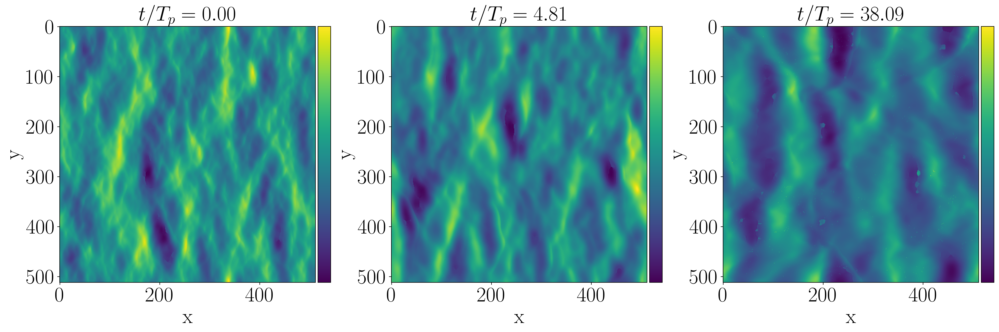

In [12]:
ind_time = [0,154,-1]
num_rows = 1
num_cols = 3

kp = 4; omegap = (1*kp)**0.5

tstart=time[0]


fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 13))
j = 0

for i in ind_time:
    eta = eta_series[i]
    
    #vmin = 0
    #vmax = 5
    #levels = np.linspace(vmin, vmax, 1000)
    
    ax = axes[j % num_cols]
    im = ax.imshow(eta)  
    
    ax.set_aspect('equal')
    ax.set_title(label=r'$ t/T_{p}=%.2f$'%((time[i]-tstart)* omegap / (2 * np.pi)))
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    
    divider = make_axes_locatable(ax)
    cax = divider.append_axes('right', size='5%', pad=0.05)
    cbar = fig.colorbar(im, cax=cax, orientation='vertical', extendrect = 'False')

    
    #cbar = fig.colorbar(im, ax=axs, pad=0.04, orientation='vertical',  extendrect = 'False', shrink= 0.6)
    cbar.ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'${int(x)}$'))
    cbar.ax.yaxis.set_major_locator(plt.FixedLocator([-20, -15, -10, -5, 0]))
    ax.figure.savefig(f'/projects/DEIKE/cmartinb/graphs/2D_spectra/kpHs{kpHs}uoc{uoc}/eta_{(omegap*(time[i]-tstart))}.png')
    
    j += 1
    
plt.tight_layout()
plt.show()

In [13]:
#pressure_series = np.load(f'/projects/DEIKE/cmartinb/pressure/pressure_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.npy', allow_pickle=True)
#print(pressure_series.shape)
#print(time.shape)

In [14]:
#pressure_series_trimmed = pressure_series[indice:, :]
#print(pressure_series_trimmed.shape)
#pressure_series = pressure_series_trimmed
#print(time.shape)

In [15]:
time_steps = [0, 250, -1] #577
fig = plt.figure(figsize=(25, 20), dpi=400) 

ls = LightSource(azdeg=315, altdeg=45)

view_angles = [
    (20, 120),
    (20, 120),
    (20, 120),
    (20, 120),
]

axes = []
for i, t in enumerate(time_steps):
    eta = eta_series[t, :, :]
    ny, nx = eta.shape
    x = np.linspace(0, nx-1, nx)
    y = np.linspace(0, ny-1, ny)
    X, Y = np.meshgrid(x, y)

    rgb = ls.shade(eta, cmap=cm.ice, vert_exag=1.0, blend_mode='soft')

    ax = fig.add_subplot(2, 2, i+1, projection='3d')
    axes.append(ax)
    ax.plot_surface(
        X, Y, eta,
        facecolors=rgb,
        rcount=200, ccount=200,
        linewidth=0,
        antialiased=True,
        shade=False
    )
    ax.view_init(elev=view_angles[i][0], azim=view_angles[i][1])
    ax.set_xlim(0, nx)
    ax.set_ylim(0, ny)
    ax.set_zlim(-0.3, 1.5)
    ax.set_axis_off()
    ax.set_title(r'$t/T_p = %.2f$' % ((time[t] - tstart) * omegap / (2*np.pi)), pad=2)

m = plt.cm.ScalarMappable(cmap=cm.ice)
m.set_array(eta_series[np.array(time_steps), :, :])
cbar = fig.colorbar(
    m, ax=axes,
    orientation='horizontal',
    fraction=0.05,  # grosor de la barra
    pad=0.08,       # separación inferior
    aspect=40
)
cbar.set_label('Elevation', fontsize=25)
plt.show()

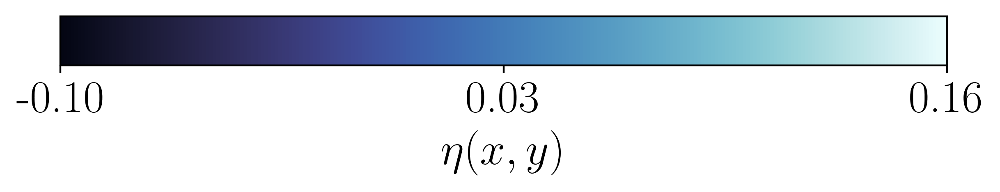

In [16]:
vmin = np.min(eta_series) -1 
vmax = np.max(eta_series) -1 
vmid = 0.5*(vmin+vmax)
m = plt.cm.ScalarMappable(cmap=cm.ice)
m.set_clim(vmin, vmax) 
m.set_array([])            

fig_cb = plt.figure(figsize=(6, 1))
ax_cb = fig_cb.add_axes([0.05, 0.5, 0.9, 0.3])

ticks = [vmin, vmid, vmax]
cbar = plt.colorbar(m, cax=ax_cb,
                    orientation='horizontal',
                    ticks=ticks,
                    fraction=0.05,
                    pad=0.08,
                    aspect=40)

cbar.ax.set_xticklabels([f"{t:.2f}" for t in ticks], fontsize=20)
cbar.set_label(r'$\eta(x,y)$', fontsize=20)
plt.show()
fig_cb.savefig(graph_path+ 'colorbar.pdf', bbox_inches='tight')
plt.close(fig_cb)

In [ ]:
ticks = [vmin, vmid, vmax]

m = plt.cm.ScalarMappable(cmap=cm.ice)
m.set_clim(vmin, vmax)
m.set_array([])

fig_cb = plt.figure(figsize=(1.5, 6)) 
ax_cb = fig_cb.add_axes([0.25, 0.05, 0.25, 0.9])
cbar = plt.colorbar(m, cax=ax_cb,
                    orientation='vertical',
                    ticks=ticks,
                    fraction=0.9,
                    pad=0.018,
                    aspect=20)

cbar.ax.set_yticklabels([f"{t:.2f}" for t in ticks], fontsize=20)
cbar.set_label(r'$\eta(x,y)$', fontsize=20, rotation=90, labelpad=10)
plt.show()

fig_cb.savefig(graph_path + 'colorbar_vertical.pdf',
               format='pdf',
               bbox_inches='tight')
plt.close(fig_cb)

In [18]:
eta = eta_series[t, :, :] - 1

vmin = np.min(eta_series) - 1
vmax = np.max(eta_series) - 1

m = plt.cm.ScalarMappable(cmap=cm.ice)
m.set_clim(vmin, vmax)
m.set_array([]) 
ticks = [vmin, 0.5*(vmin+vmax), vmax]
cbar = plt.colorbar(m, cax=ax_cb,
                    orientation='horizontal',
                    ticks=ticks,
                    fraction=0.05,
                    pad=0.08,
                    aspect=40)
cbar.ax.set_xticklabels([f"{t:.2f}" for t in ticks])
cbar.set_label(r'$\eta(x,y) - 1$', fontsize=14)
plt.show()

fig_cb.savefig(graph_path+ 'colorbar.pdf', bbox_inches='tight')
plt.close(fig_cb)

<Figure size 6000x2400 with 0 Axes>

In [19]:
save_filename= f'/projects/DEIKE/cmartinb/processed_profiles/processed_profiles_re{reA}_bo0{Bo}_P{kpHs}_uoc{uoc}_reW{reW}_L{maxLevel}.csv'
#columns = ['time', 'istep', 'phi', 'u.x', 'u.y', 'u.z', 'p', 'omega', 'uv', 'duy', 'diss', 'ke', 'vke', 'dkdy']
profiles_df = pd.read_csv(save_filename)

In [20]:
print(profiles_df['time']-profiles_df['time'][0])
print(time-time[0])

0        0.000000
1        0.196349
2        0.392699
3        0.589049
4        0.785398
          ...    
618    121.344016
619    121.540366
620    121.736715
621    121.933065
622    122.129414
Name: time, Length: 623, dtype: float64
[0.00000000e+00 9.81748000e-02 1.96349600e-01 ... 1.19478696e+02
 1.19576870e+02 1.19675045e+02]


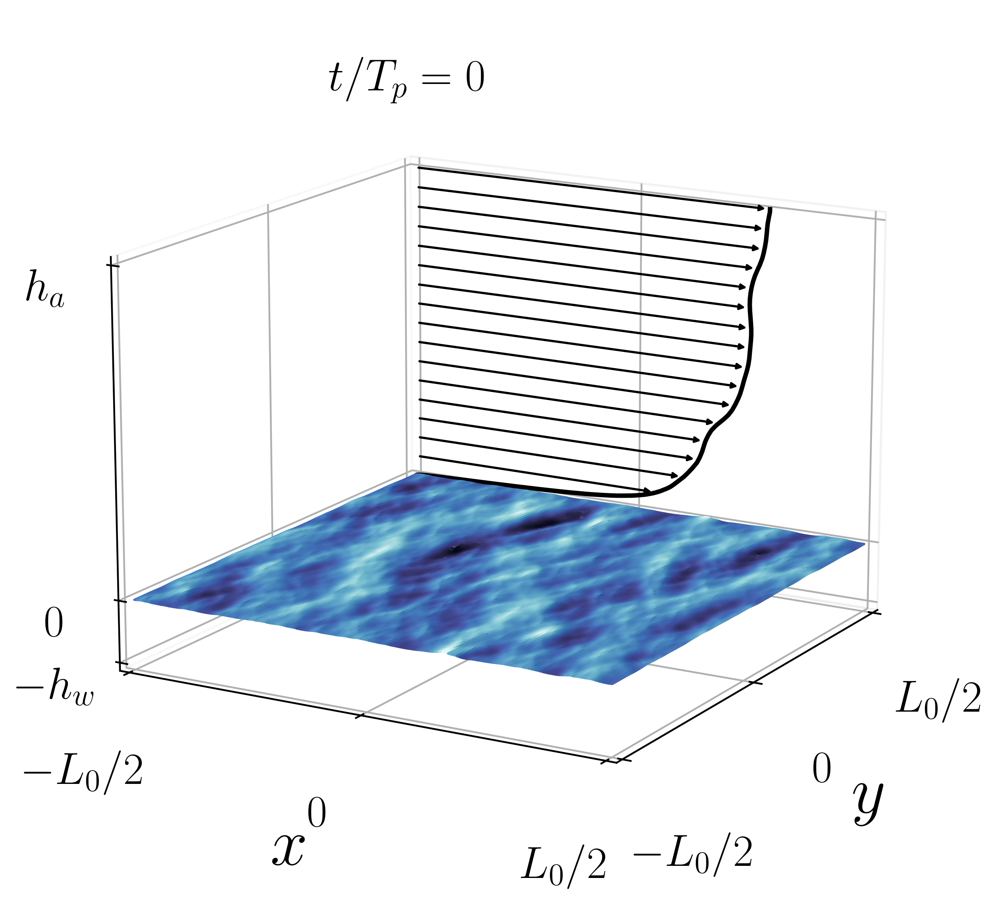

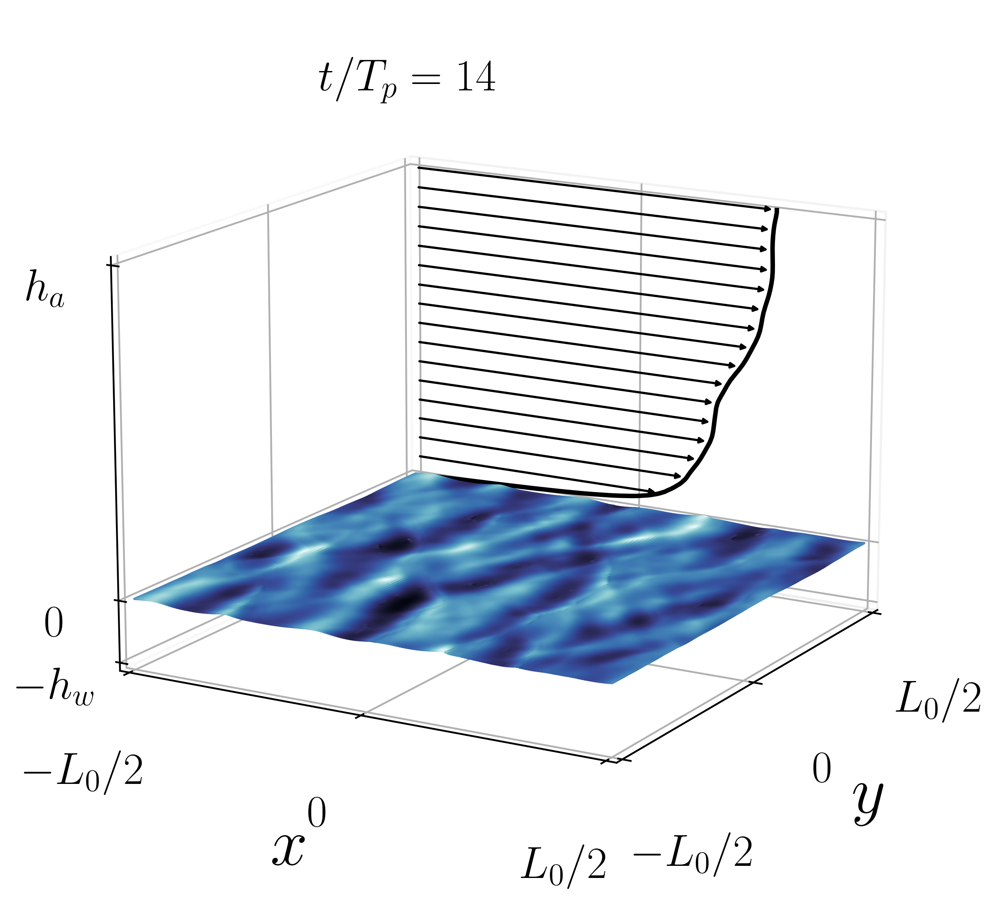

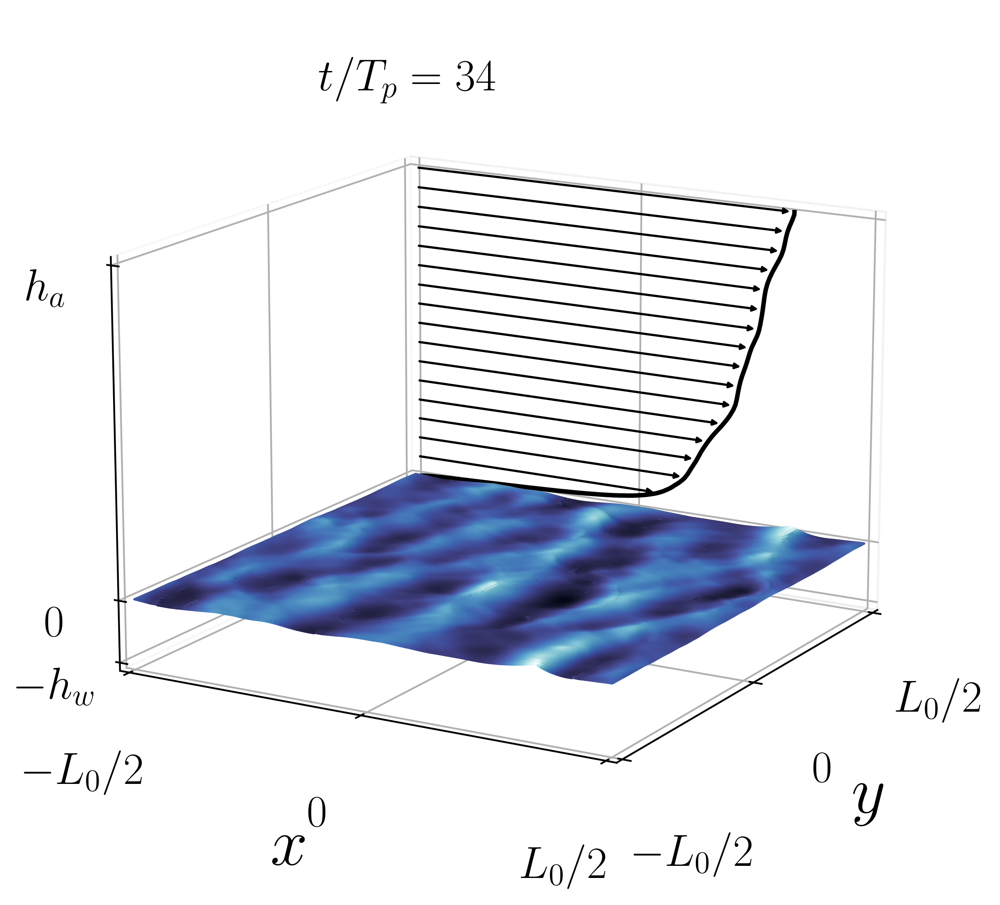

In [23]:
nn_list = [0, 450, 1100]
#nn_list = [0,200, -1]
ny, nx = eta_series.shape[1], eta_series.shape[2]
x = np.linspace(-np.pi, np.pi, nx)
y = np.linspace(-np.pi, np.pi, ny)
X, Y = np.meshgrid(x, y)
dx, dy = x[1] - x[0], y[1] - y[0]

nn=400
phi_str   = profiles_df.at[nn, 'phi']
u_str     = profiles_df.at[nn, 'u.x']
phi_array = np.array(ast.literal_eval(str(phi_str)))
u_array   = np.array(ast.literal_eval(str(u_str)))

ticks  = [-np.pi+0.6, 0, np.pi+0.6]
labels = [r'$-L_{0}/2$', '0', r'$L_{0}/2$']

zmin, zmax = -1, (2*np.pi-1)
x0_plane   = - np.pi
scale      = 1 


ticks  = [-np.pi, 0, np.pi]
labels = [r'$-L_{0}/2$', '0', r'$L_{0}/2$']

ticksy  = [ 0, np.pi]
labelsy = [ '0', r'$L_{0}/2$']

zticks = [zmin,0,zmax]
zlabels = [r'$-h_w$', '0', r'$h_a$']


x_prof_full = x0_plane + u_array * scale
y0_full     = np.ones_like(u_array)*np.pi
zs_full     = phi_array
mask        = (zs_full >= zmin) & (zs_full <= zmax)
for nn in nn_list:

    eta = eta_series[nn, :, :] -1 
    t_nn = time[nn]

    times_profiles = profiles_df['time'].values
    idx_prof = np.argmin(np.abs(times_profiles - t_nn))
    
    phi_array = np.array(ast.literal_eval(profiles_df.at[idx_prof, 'phi']))
    u_array   = np.array(ast.literal_eval(profiles_df.at[idx_prof, 'u.x']))  # repite para y,z si las necesitas
    #print(phi_array[-1])

    scale = 1
    x_prof_full = x0_plane + u_array * scale
    y0_full     = np.ones_like(u_array)*np.pi

    mask = (phi_array >= zmin) & (phi_array <= zmax)
    valid_idxs = np.where(mask)[0]
    idxs = valid_idxs[np.linspace(0, len(valid_idxs)-1, 20, dtype=int)]
    
    fig = plt.figure(figsize=(10,7))
    ax  = fig.add_subplot(111, projection='3d')
    
    #ax.plot3D(x_prof_full[mask], y0_full[mask], phi_array[mask]-1, 'k-', linewidth=2)
    ax.plot3D(x_prof_full, y0_full, phi_array-1, 'k-', linewidth=2)
    
    mask = (phi_array >= zmin + 1) & (phi_array <= zmax + 1)  
    valid_idxs = np.where(mask)[0]  
    idxs = valid_idxs[np.linspace(0, len(valid_idxs)-1, 20, dtype=int)]
    for i in idxs:
        z0 = phi_array[i] - 1
        if z0 < 0:
            continue 
    
        dx_arr = u_array[i] * scale 
    
        arr = Arrow3D(
            [x0_plane,    x0_plane + dx_arr], 
            [np.pi,        np.pi],          
            [z0,          z0],  
            mutation_scale=5,
            lw=1,
            arrowstyle='-|>',
            color='k',
            alpha=1.0
        )
        arr.set_clip_on(False)
        ax.add_artist(arr)
    ls  = LightSource(azdeg=315, altdeg=45)
    rgb = ls.shade(eta, cmap=cm.ice, vert_exag=1.0, blend_mode='soft')
    ax.plot_surface(X, Y, eta, facecolors=rgb, rcount=200, ccount=200,
                    antialiased=True, shade=False)
    
    
    ax.set_xticks(ticks);    ax.set_xticklabels(labels)
    ax.set_yticks(ticks);    ax.set_yticklabels(labels)
    ax.set_zticks(zticks);    ax.set_zticklabels(zlabels)
    ax.set_zlabel(r'$z$', labelpad = 25)
    ax.zaxis.set_ticks_position('lower')
    ax.zaxis.set_label_position('lower')

    ax.yaxis.set_ticks_position('lower')
    ax.yaxis.set_label_position('lower')
    
    ax.tick_params(axis='y', labelsize=20, pad =20)  
    ax.tick_params(axis='z', labelsize=20, pad =20)  
    ax.tick_params(axis='x', labelsize=20, pad =20)  
    ax.zaxis.set_tick_params(pad=8)
    ax.zaxis.labelpad = 12
    ax.set_zlabel('z',labelpad = 20)
    #ax.set_zlim(zmin, zmax)
    ax.set_xlabel(f'$x$', labelpad = 25);  ax.set_ylabel(f'$y$', labelpad = 25);
    ax.grid(True)
    ax.xaxis.pane.fill = ax.yaxis.pane.fill = ax.zaxis.pane.fill = False
    ax.view_init(elev=15, azim=120)
    ax.set_xlim(np.pi, -np.pi)
    ax.set_ylim(np.pi, -np.pi)
    ax.text2D(
    0.4, 0.9, 
    r'$t/T_p = %.0f$' % ((time[nn] - tstart)*omegap/(2*np.pi)),
    transform=ax.transAxes,
    ha='center',
    va='bottom',
    fontsize=20
    )
    plt.savefig(graph_path + f'/fullsketch_t{(time[nn] - tstart) * omegap / (2*np.pi)}.pdf', dpi=600, bbox_inches='tight')
    #plt.tight_layout()
    plt.show()

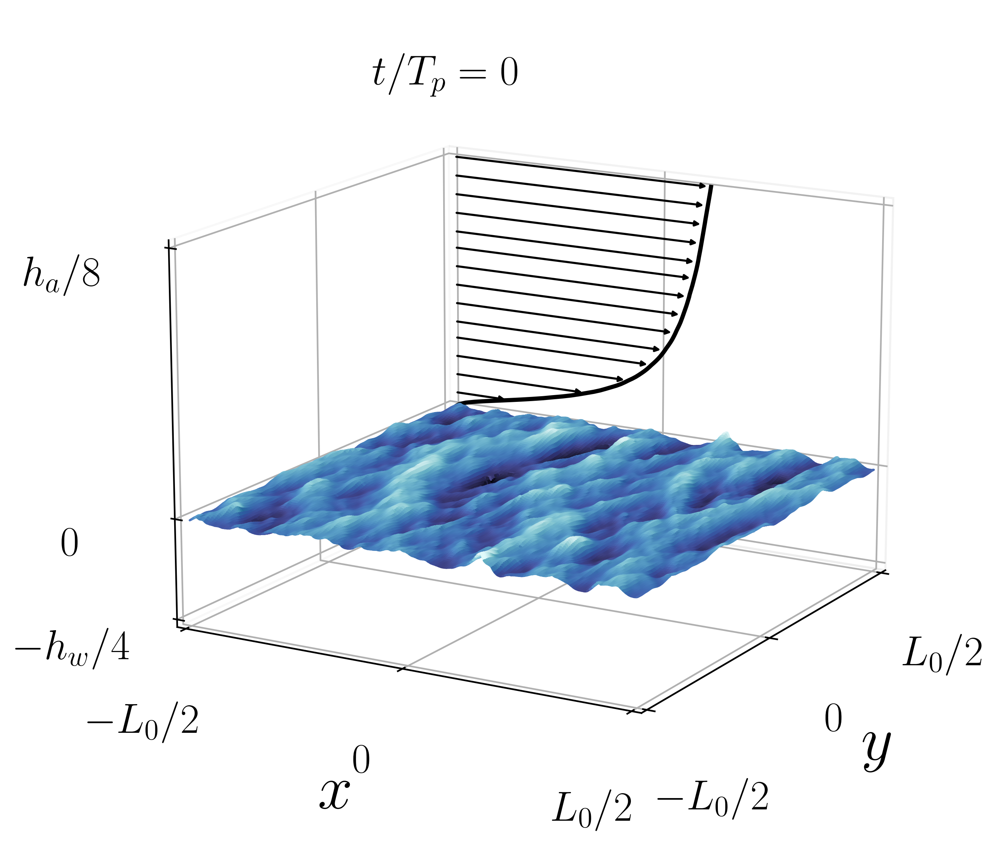

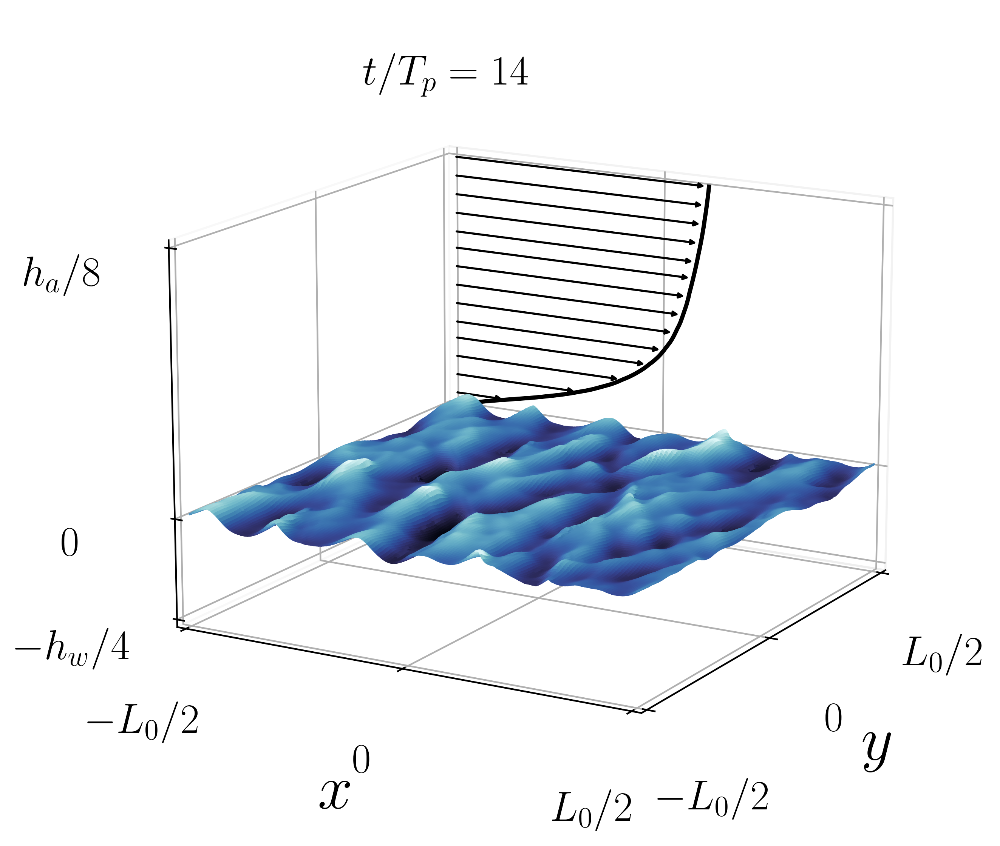

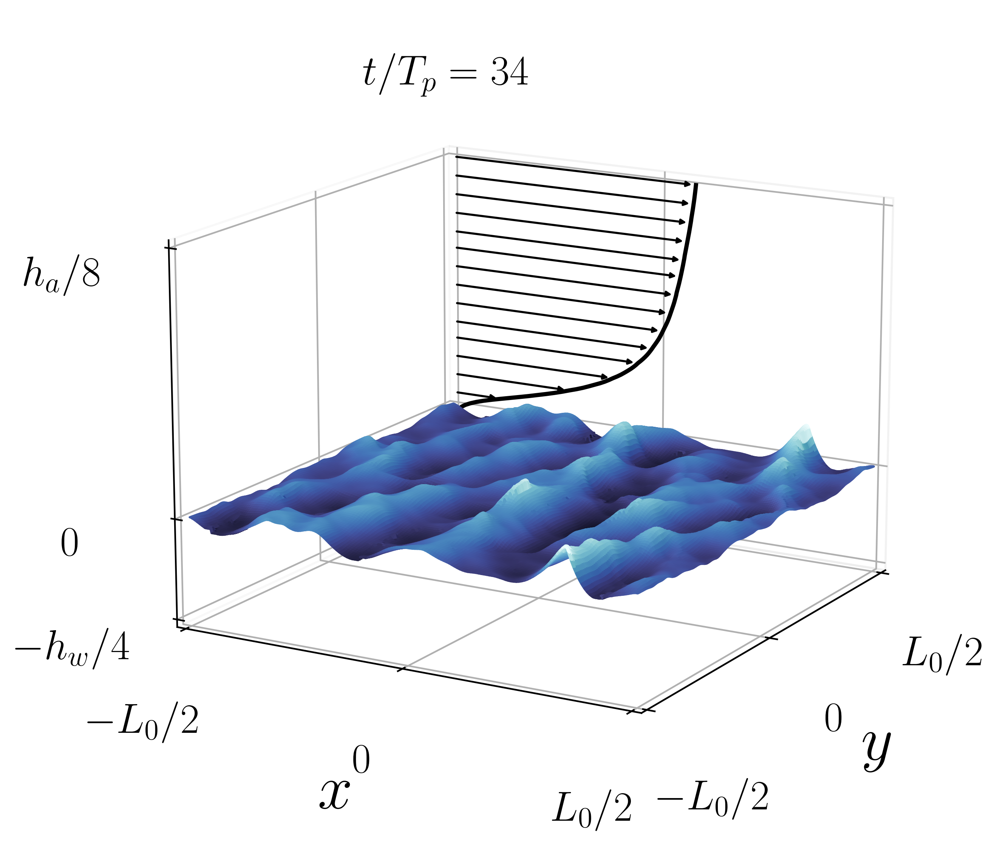

In [25]:
ticks  = [-np.pi, 0, np.pi]
labels = [r'$-L_{0}/2$', '0', r'$L_{0}/2$']

zmin, zmax = -1/4, (2*np.pi-1)/8
x0_plane   = -np.pi
scale      = 0.8 * (2*np.pi) / u_array.max()

zticks = [zmin,0,zmax]
zlabels = [r'$-h_w/4$',r'$0$',r'$h_a/8$']


x_prof_full = x0_plane + u_array * scale
y0_full     = np.ones_like(u_array)*np.pi
zs_full     = phi_array
mask        = (zs_full >= zmin) & (zs_full <= zmax)


for nn in nn_list:
    eta = eta_series[nn, :, :] -1 
    t_nn = time[nn]
    
    times_profiles = profiles_df['time'].values
    idx_prof = np.argmin(np.abs(times_profiles - t_nn))
    
    phi_array = np.array(ast.literal_eval(profiles_df.at[idx_prof, 'phi']))
    u_array   = np.array(ast.literal_eval(profiles_df.at[idx_prof, 'u.x']))  # repite para y,z si las necesitas

    scale = 0.8 * (2*np.pi) / u_array.max()
    x_prof_full = x0_plane + u_array * scale
    y0_full     = np.ones_like(u_array)*np.pi

    fig = plt.figure(figsize=(10,7))
    ax  = fig.add_subplot(111, projection='3d')
    mask = (phi_array >= zmin + 1) & (phi_array <= zmax + 1)  
    ax.plot3D(x_prof_full[mask], y0_full[mask], phi_array[mask]-1 , 'k-', linewidth=2)

    mask = (phi_array >= zmin + 1) & (phi_array <= zmax + 1)  
    valid_idxs = np.where(mask)[0]  
    idxs = valid_idxs[np.linspace(0, len(valid_idxs)-1, 20, dtype=int)]
    for i in idxs:
        z0 = phi_array[i] - 1      
        if z0 < 0:
            continue              
    
        dx_arr = u_array[i] * scale 
    
        arr = Arrow3D(
            [x0_plane,    x0_plane + dx_arr],  
            [np.pi,        np.pi],               
            [z0,          z0],                
            mutation_scale=5,
            lw=1,
            arrowstyle='-|>',
            color='k',
            alpha=1.0
        )
        arr.set_clip_on(False)
        ax.add_artist(arr)
    ls  = LightSource(azdeg=315, altdeg=45)
    rgb = ls.shade(eta, cmap=cm.ice, vert_exag=1.0, blend_mode='soft')
    ax.plot_surface(X, Y, eta, facecolors=rgb, rcount=200, ccount=200,
                    antialiased=True, shade=False)
    
    ax.set_xticks(ticks);    ax.set_xticklabels(labels)
    ax.set_yticks(ticks);    ax.set_yticklabels(labels)
    ax.set_zticks(zticks);    ax.set_zticklabels(zlabels)
    ax.zaxis.set_ticks_position('lower')
    ax.zaxis.set_label_position('lower')

    ax.yaxis.set_ticks_position('lower')
    ax.yaxis.set_label_position('lower')
    
    ax.tick_params(axis='z', labelsize=20,pad =20)     
    ax.tick_params(axis='x', labelsize=20,pad =20)  
    ax.tick_params(axis='y', labelsize=20, pad =20)  
    ax.zaxis.labelpad = 12
    ax.set_xlabel(f'$x$', labelpad = 25);  ax.set_ylabel(f'$y$', labelpad = 25);
    ax.grid(True)
    ax.xaxis.pane.fill = ax.yaxis.pane.fill = ax.zaxis.pane.fill = False
    ax.view_init(elev=15, azim=120)
    ax.set_xlim(np.pi, -np.pi) 
    ax.set_ylim(np.pi, -np.pi)
    
    ax.text2D(
    0.4, 0.9, 
    r'$t/T_p = %.0f$' % ((time[nn] - tstart)*omegap/(2*np.pi)),
    transform=ax.transAxes,
    ha='center',
    va='bottom',
    fontsize=20
    )
    
    plt.savefig(graph_path + f'/zoomsketch_t{(time[nn] - tstart) * omegap / (2*np.pi)}.pdf', dpi=600, bbox_inches='tight')
    plt.show()
